<a href="https://colab.research.google.com/github/Alejocas17/miniproyecto2_NN/blob/main/miniproyecto2_AlejandroCastillo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Miniproyecto 2: Compresión de imgágenes usando Mapas Autoorganizados (SOM)**

#Importing libraries

In [1]:
!pip install git+https://github.com/sevamoo/SOMPY
!pip install scikit-image
import numpy as np
from matplotlib import pyplot as plt
from PIL import Image
from skimage import io
from sklearn.cluster import KMeans
from sompy import SOMFactory
%matplotlib inline

  Cloning https://github.com/sevamoo/SOMPY to /tmp/pip-req-build-c32uvsc6
  Running command git clone -q https://github.com/sevamoo/SOMPY /tmp/pip-req-build-c32uvsc6


Loaded backend module://ipykernel.pylab.backend_inline version unknown.
Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Importing image

##For local runtime

In [ ]:
data= io.imread('/users/alejo/Downloads/Lab05_RNA/messi.jpeg');

print(data.shape)
io.imshow(data)
io.show()

##For hosted runtime

(428, 640, 3)


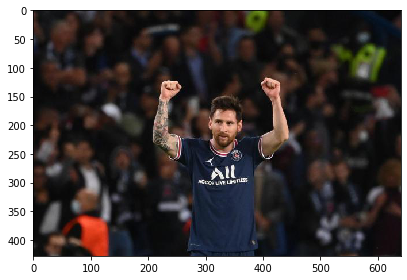

In [3]:
data= io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/messi.jpeg');
print(data.shape)
io.imshow(data)
# io.show()

#Preprocessing

In [4]:
#Splitting the color channels of the image
dataR = data[:,:,0]
dataG = data[:,:,1]
dataB = data[:,:,2]
#Reshaping the channels
dataR=dataR.reshape(np.product((len(dataR), np.prod(dataR.shape[1:]))))
dataG=dataG.reshape(np.product((len(dataG), np.prod(dataG.shape[1:]))))
dataB=dataB.reshape(np.product((len(dataB), np.prod(dataB.shape[1:]))))
#Stacking the data in shape: (rows*cols,3)
data1=np.column_stack([np.transpose(dataR), np.transpose(dataG), np.transpose(dataB)])
data1.shape

(273920, 3)

In [5]:
#Normalizing the data
data1=data1.astype('float32')/255

#Creating and training the self organizing maps based neural network

In [ ]:

sm1 = SOMFactory().build(data1, mapsize = [40,40], lattice='hexa', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='random', name='messihexaRandom', component_names=['R','G','B'])
sm2 = SOMFactory().build(data1, mapsize = [40,40], lattice='hexa', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='pca', name='messihexaPca', component_names=['R','G','B'])
sm3 = SOMFactory().build(data1, mapsize = [40,40], lattice='rect', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='pca', name='messirectPca', component_names=['R','G','B'])

In [ ]:
sm1.train(n_job=8, verbose='info', train_rough_len=10, train_finetune_len=5)
sm2.train(n_job=8, verbose='info', train_rough_len=10, train_finetune_len=5)
sm3.train(n_job=8, verbose='info', train_rough_len=10, train_finetune_len=5)

 Training...
 random_initialization took: 0.020000 seconds
 Rough training...
 radius_ini: 14.000000 , radius_final: 2.333333, trainlen: 10

 epoch: 1 ---> elapsed time:  8.556000, quantization error: 0.300170

 epoch: 2 ---> elapsed time:  8.471000, quantization error: 1.229644

 epoch: 3 ---> elapsed time:  8.551000, quantization error: 1.172482

 epoch: 4 ---> elapsed time:  8.650000, quantization error: 1.113563

 epoch: 5 ---> elapsed time:  8.853000, quantization error: 1.073828

 epoch: 6 ---> elapsed time:  8.773000, quantization error: 1.025963

 epoch: 7 ---> elapsed time:  8.987000, quantization error: 0.958805

 epoch: 8 ---> elapsed time:  8.752000, quantization error: 0.861797

 epoch: 9 ---> elapsed time:  8.836000, quantization error: 0.721810

 epoch: 10 ---> elapsed time:  8.844000, quantization error: 0.524245

 Finetune training...
 radius_ini: 3.333333 , radius_final: 1.000000, trainlen: 5

 epoch: 1 ---> elapsed time:  8.817000, quantization error: 0.301516

 epoc

In [ ]:
topographic_error1 = sm1.calculate_topographic_error()
topographic_error2 = sm2.calculate_topographic_error()
topographic_error3 = sm3.calculate_topographic_error()
quantization_error1 = np.mean(sm1._bmu[1])
quantization_error2 = np.mean(sm2._bmu[1])
quantization_error3 = np.mean(sm3._bmu[1])
print ("Error Topográfico1 = %s; Error de Cuantificación1 = %s" % (topographic_error1, quantization_error1))
print ("Error Topográfico2 = %s; Error de Cuantificación2 = %s" % (topographic_error2, quantization_error2))
print ("Error Topográfico3 = %s; Error de Cuantificación3 = %s" % (topographic_error3, quantization_error3))

Error Topográfico1 = 0.06777891355140186; Error de Cuantificación1 = 0.1046567190568639
Error Topográfico2 = 0.23409754672897196; Error de Cuantificación2 = 0.08653321838551019
Error Topográfico3 = 0.08430928738317757; Error de Cuantificación3 = 0.06085186488448965


In [ ]:
cl1=sm1.cluster(32)
cl2=sm2.cluster(32)
cl3=sm3.cluster(32)


In [ ]:
sm1p = sm1.project_data(data1)
sm2p = sm2.project_data(data1)
sm3p = sm3.project_data(data1)
cluster1=cl1[sm1p]
cluster2=cl2[sm2p]
cluster3=cl3[sm3p]

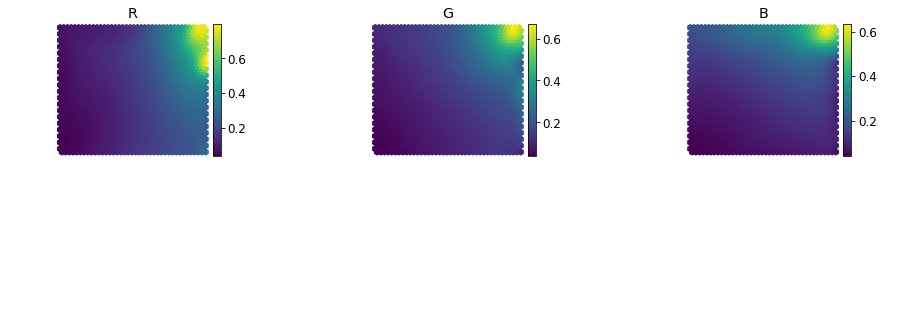

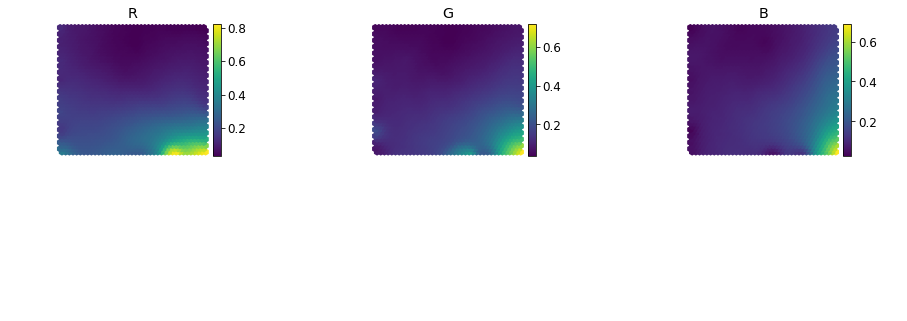

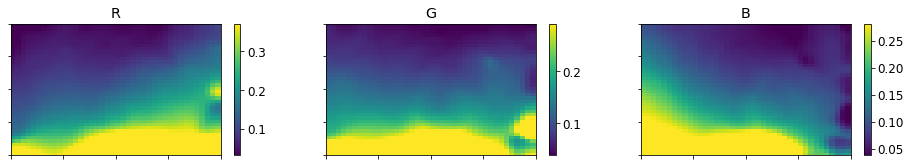

In [ ]:
from sompy.visualization.mapview import View2D
view2d1  = View2D(1,3,"",text_size=12)
view2d2  = View2D(1,3,"",text_size=12)
view2d3  = View2D(1,3,"",text_size=12)
view2d1.show(sm1, col_sz=3, which_dim="all", denormalize=True, what='codebook')
view2d2.show(sm2, col_sz=3, which_dim="all", denormalize=True, what='codebook')
view2d3.show(sm3, col_sz=3, which_dim="all", denormalize=True, what='codebook')

/usr/local/lib/python3.7/dist-packages/sompy/visualization/hitmap.py:37: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  ax = self._fig.add_subplot(111)


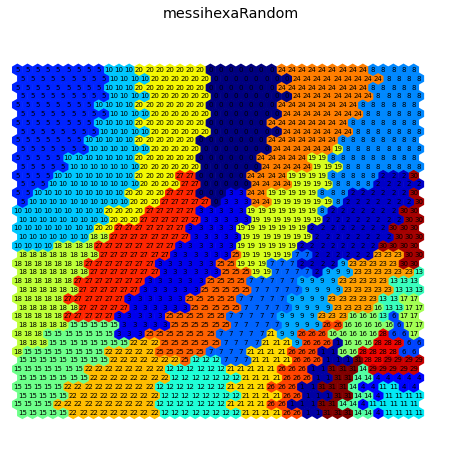

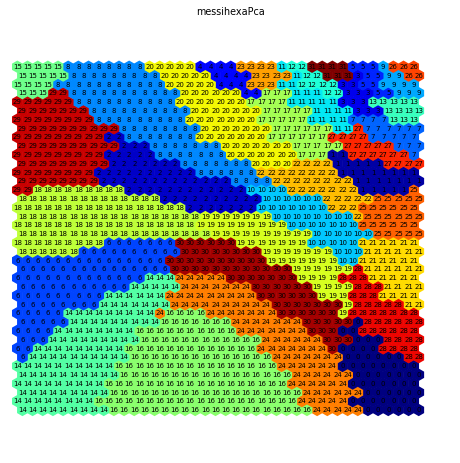

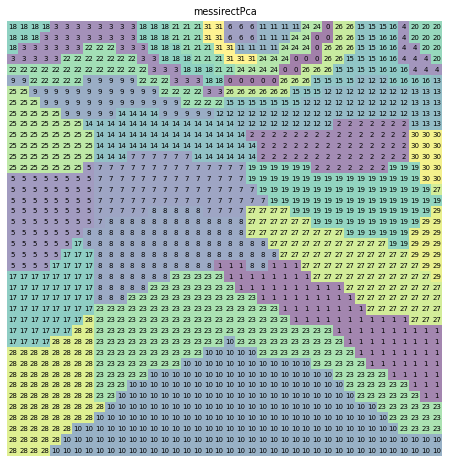

In [ ]:
from sompy.visualization import hitmap
name1=sm1.name
name2=sm2.name
name3=sm3.name
h1 = hitmap.HitMapView(8, 8, title=name1, text_size=8, show_text=True)
h2 = hitmap.HitMapView(8, 8, title=name2, text_size=8, show_text=True)
h3 = hitmap.HitMapView(8, 8, title=name3, text_size=8, show_text=True)
h1.show(sm1)
h2.show(sm2)
h3.show(sm3)

In [ ]:
#Recovering the image with trained SOM
neurons1 = sm1._normalizer.denormalize_by(sm1.data_raw,sm1.codebook.matrix)
neurons2 = sm2._normalizer.denormalize_by(sm2.data_raw,sm2.codebook.matrix)
neurons3 = sm3._normalizer.denormalize_by(sm3.data_raw,sm3.codebook.matrix)

In [ ]:
promedio1 = np.zeros([32,3])
for i in range(32):
    acumulador1= []
    [acumulador1.append(neurons1[j,:]) for j in range(len(cl1)) if (i == cl1[j])]
    promedio1[i,:] = np.mean(acumulador1, axis=0)
promedio2 = np.zeros([32,3])
for i in range(32):
    acumulador2= []
    [acumulador2.append(neurons2[j,:]) for j in range(len(cl2)) if (i == cl2[j])]
    promedio2[i,:] = np.mean(acumulador2, axis=0)
promedio3 = np.zeros([32,3])
for i in range(32):
    acumulador3 = []
    [acumulador3.append(neurons3[j,:]) for j in range(len(cl3)) if (i == cl3[j])]
    promedio3[i,:] = np.mean(acumulador3, axis=0)

In [ ]:
nimg1 = []
nimg2 = []
nimg3 = []
[nimg1.append(promedio1[cluster1[i]]) for i in range(len(sm1p))]
[nimg2.append(promedio2[cluster2[i]]) for i in range(len(sm2p))]
[nimg3.append(promedio3[cluster3[i]]) for i in range(len(sm3p))]
nimg1 = np.reshape(nimg1,[len(data1),3])
nimg1 = np.reshape(nimg1,np.shape(data))
nimg2 = np.reshape(nimg2,[len(data1),3])
nimg2 = np.reshape(nimg2,np.shape(data))
nimg3 = np.reshape(nimg3,[len(data1),3])
nimg3 = np.reshape(nimg3,np.shape(data))

In [ ]:
# nimg1=(nimg1.astype('float64'))/np.max(nimg1)
nimg1=(nimg1.astype('float64'))*255

# nimg2=(nimg2.astype('float64'))/np.max(nimg2)
nimg2=(nimg2.astype('float64'))*255

# nimg3=(nimg3.astype('float64'))/np.max(nimg3)
nimg3=(nimg3.astype('float64'))*255

#Visualizing

Text(0.5, 1.0, 'messirectPca')

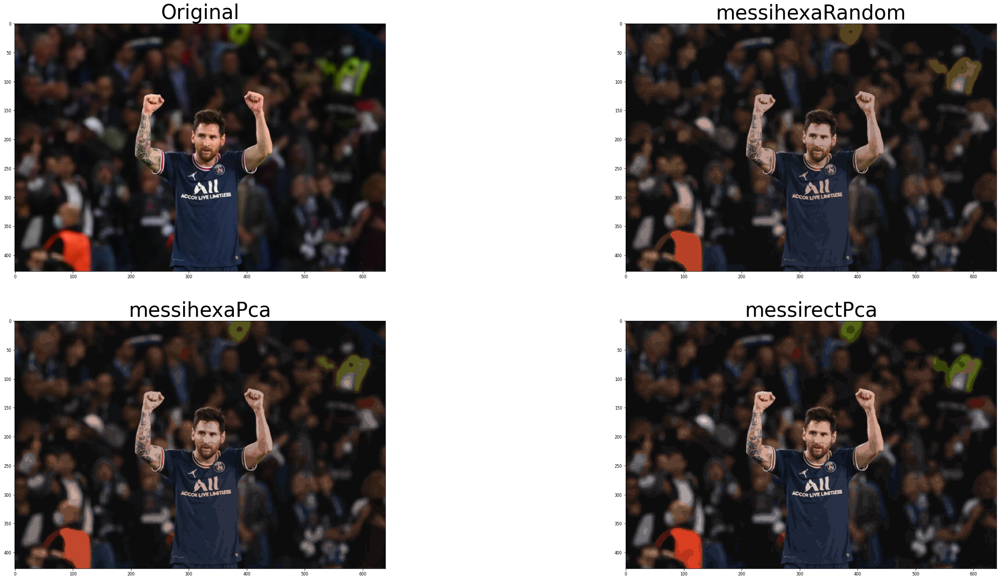

In [ ]:
plt.figure(figsize=(40, 20))
img1=(data.reshape(428,640,3)).astype('uint8')
img2=nimg1.astype('uint8')
img3=nimg2.astype('uint8')
img4=nimg3.astype('uint8')

ax = plt.subplot(2, 2, 1)
plt.imshow(img1)
plt.title('Original',fontsize=40)
ax = plt.subplot(2, 2, 2)
plt.imshow(img2)
plt.title(name1,fontsize=40)
ax = plt.subplot(2, 2, 3)
plt.imshow(img3)
plt.title(name2,fontsize=40)
ax = plt.subplot(2, 2, 4)
plt.imshow(img4)
plt.title(name3,fontsize=40)

#Saving the image

In [491]:
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/original.jpg',img1)
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaHRand40.jpg',img2)
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaHPca40.jpg',img3)
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40.jpg',img4)

#Changing colors / clusters

In [ ]:
sm4 = SOMFactory().build(data1, mapsize = [40,40], lattice='rect', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='pca', name='messipca', component_names=['R','G','B'])
sm5 = SOMFactory().build(data1, mapsize = [40,40], lattice='rect', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='pca', name='messirect', component_names=['R','G','B'])
sm6 = SOMFactory().build(data1, mapsize = [40,40], lattice='rect', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='pca', name='messipcarect', component_names=['R','G','B'])

In [ ]:
sm4.train(n_job=8, verbose='info', train_rough_len=15, train_finetune_len=5)
sm5.train(n_job=8, verbose='info', train_rough_len=15, train_finetune_len=5)
sm6.train(n_job=8, verbose='info', train_rough_len=15, train_finetune_len=5)

 Training...
 pca_linear_initialization took: 0.244000 seconds
 Rough training...
 radius_ini: 5.000000 , radius_final: 1.250000, trainlen: 15

 epoch: 1 ---> elapsed time:  7.379000, quantization error: 0.343764

 epoch: 2 ---> elapsed time:  8.535000, quantization error: 0.213169

 epoch: 3 ---> elapsed time:  8.551000, quantization error: 0.164841

 epoch: 4 ---> elapsed time:  8.143000, quantization error: 0.158520

 epoch: 5 ---> elapsed time:  9.872000, quantization error: 0.151250

 epoch: 6 ---> elapsed time:  9.370000, quantization error: 0.142544

 epoch: 7 ---> elapsed time:  8.311000, quantization error: 0.133473

 epoch: 8 ---> elapsed time:  8.222000, quantization error: 0.124304

 epoch: 9 ---> elapsed time:  8.553000, quantization error: 0.115543

 epoch: 10 ---> elapsed time:  8.630000, quantization error: 0.107273

 epoch: 11 ---> elapsed time:  8.134000, quantization error: 0.099828

 epoch: 12 ---> elapsed time:  8.111000, quantization error: 0.093687

 epoch: 13 --

In [ ]:
colors1=32
colors2=64
colors3=128
cl4=sm4.cluster(colors1)
cl5=sm5.cluster(colors2)
cl6=sm6.cluster(colors3)
sm4p = sm4.project_data(data1)
sm5p = sm5.project_data(data1)
sm6p = sm6.project_data(data1)
cluster4=cl4[sm4p]
cluster5=cl5[sm5p]
cluster6=cl6[sm6p]

In [ ]:
neurons4 = sm4._normalizer.denormalize_by(sm4.data_raw,sm4.codebook.matrix)
neurons5 = sm5._normalizer.denormalize_by(sm5.data_raw,sm5.codebook.matrix)
neurons6 = sm6._normalizer.denormalize_by(sm6.data_raw,sm6.codebook.matrix)

In [ ]:
promedio4 = np.zeros([colors1,3])
for i in range(colors1):
    acumulador4= []
    [acumulador4.append(neurons4[j,:]) for j in range(len(cl4)) if (i == cl4[j])]
    promedio4[i,:] = np.mean(acumulador4, axis=0)
promedio5 = np.zeros([colors2,3])
for i in range(colors2):
    acumulador5= []
    [acumulador5.append(neurons5[j,:]) for j in range(len(cl5)) if (i == cl5[j])]
    promedio5[i,:] = np.mean(acumulador5, axis=0)
promedio6 = np.zeros([colors3,3])
for i in range(colors3):
    acumulador6= []
    [acumulador6.append(neurons6[j,:]) for j in range(len(cl6)) if (i == cl6[j])]
    promedio6[i,:] = np.mean(acumulador6, axis=0)

In [ ]:
nimg4 = []
nimg5 = []
nimg6 = []
[nimg4.append(promedio4[cluster4[i]]) for i in range(len(sm4p))]
[nimg5.append(promedio5[cluster5[i]]) for i in range(len(sm5p))]
[nimg6.append(promedio6[cluster6[i]]) for i in range(len(sm6p))]
nimg4 = np.reshape(nimg4,[len(data1),3])
nimg4 = np.reshape(nimg4,np.shape(data))
nimg5 = np.reshape(nimg5,[len(data1),3])
nimg5 = np.reshape(nimg5,np.shape(data))
nimg6 = np.reshape(nimg6,[len(data1),3])
nimg6 = np.reshape(nimg6,np.shape(data))


In [ ]:
# nimg1=(nimg1.astype('float64'))/np.max(nimg1)
nimg4=(nimg4.astype('float64'))*255

# nimg2=(nimg2.astype('float64'))/np.max(nimg2)
nimg5=(nimg5.astype('float64'))*255

# nimg3=(nimg3.astype('float64'))/np.max(nimg3)
nimg6=(nimg6.astype('float64'))*255

Text(0.5, 1.0, 'with 128 colors')

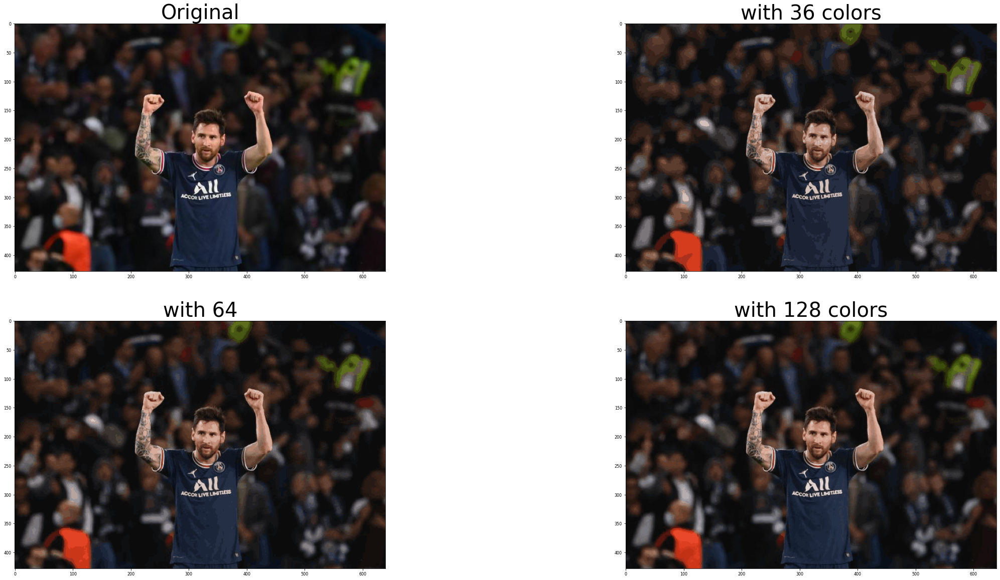

In [ ]:
plt.figure(figsize=(40, 20))
img1=(data.reshape(428,640,3)).astype('uint8')
img5=(nimg4).astype('uint8')
img6=(nimg5).astype('uint8')
img7=(nimg6).astype('uint8')


ax = plt.subplot(2, 2, 1)
plt.imshow(img1)
plt.title('Original',fontsize=40)
ax = plt.subplot(2, 2, 2)
plt.imshow(img5)
plt.title('with 32 colors',fontsize=40)
ax = plt.subplot(2, 2, 3)
plt.imshow(img6)
plt.title('with 64',fontsize=40)
ax = plt.subplot(2, 2, 4)
plt.imshow(img7)
plt.title('with 128 colors',fontsize=40)

In [ ]:
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40_32.jpeg',img5)
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40_64.jpeg',img6)
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40_128.jpeg',img7)

#Comparison between colors, mapsize and topologies

In [ ]:
original=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/original.jpeg');
mapaRPca10=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca10.jpeg');
mapaRPca20=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca20.jpeg');
mapaRPca40=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40.jpeg');
mapaHRand40=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaHRand40.jpeg');
mapaHPca40=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaHPca40.jpeg');
mapaRPca40_32=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40_32.jpeg');
mapaRPca40_64=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40_64.jpeg');
mapaRPca40_128=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapaRPca40_128.jpeg');

Text(0.5, 0.98, '32 Colors Comparison of mapsize')

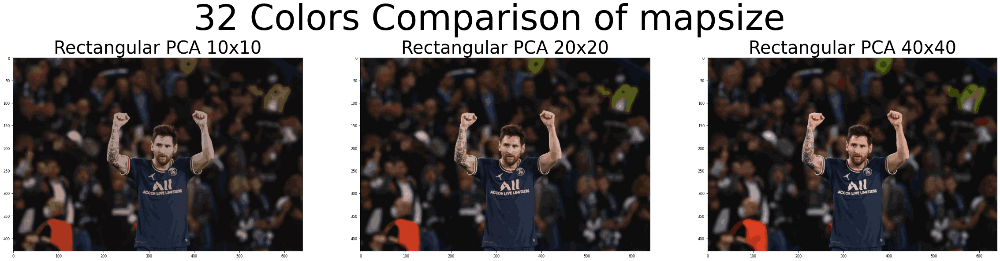

In [ ]:
fig=plt.figure(figsize=(40, 10))

ax = plt.subplot(1, 3, 1)
plt.imshow(mapaRPca10)
plt.title('Rectangular PCA 10x10',fontsize=40)
ax = plt.subplot(1, 3, 2)
plt.imshow(mapaRPca20)
plt.title('Rectangular PCA 20x20',fontsize=40)
ax = plt.subplot(1, 3, 3)
plt.imshow(mapaRPca40)
plt.title('Rectangular PCA 40x40',fontsize=40)

fig.suptitle('32 Colors Comparison of mapsize',fontsize=80)

Text(0.5, 0.98, '32 Colors Comparison of topology')

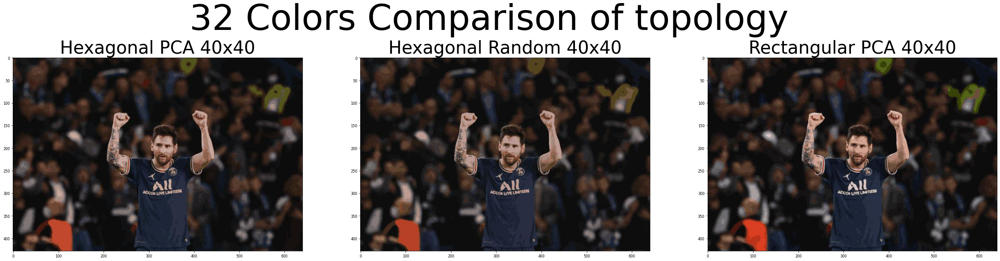

In [ ]:
fig=plt.figure(figsize=(40, 10))

ax = plt.subplot(1, 3, 1)
plt.imshow(mapaHPca40)
plt.title('Hexagonal PCA 40x40',fontsize=40)
ax = plt.subplot(1, 3, 2)
plt.imshow(mapaHRand40)
plt.title('Hexagonal Random 40x40',fontsize=40)
ax = plt.subplot(1, 3, 3)
plt.imshow(mapaRPca40)
plt.title('Rectangular PCA 40x40',fontsize=40)

fig.suptitle('32 Colors Comparison of topology',fontsize=80)

Text(0.5, 0.98, '32 64 and 128 Colors Comparison')

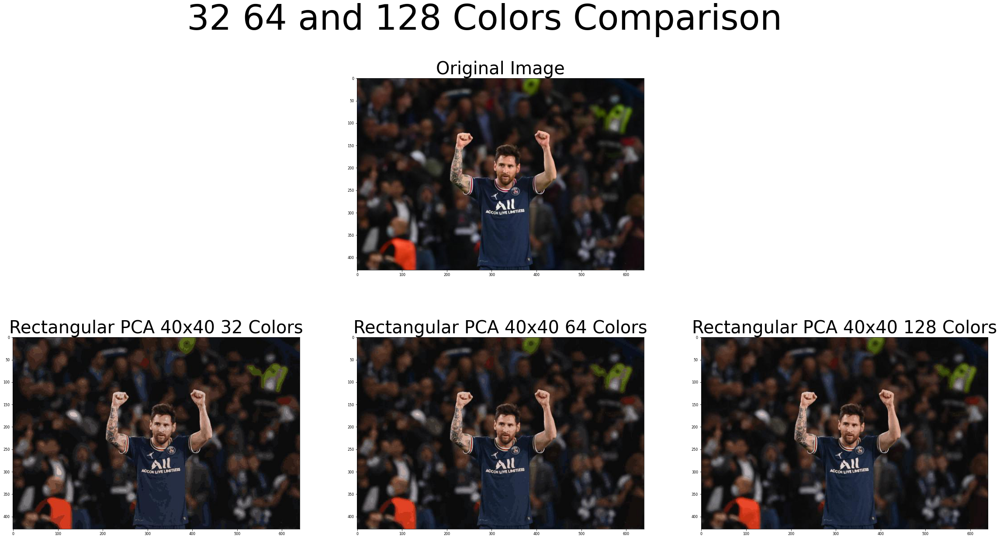

In [ ]:
fig=plt.figure(figsize=(40, 20))

ax = plt.subplot(2, 3, 2)
plt.imshow(original)
plt.title('Original Image',fontsize=40)

ax = plt.subplot(2, 3, 4)
plt.imshow(mapaRPca40_32)
plt.title('Rectangular PCA 40x40 32 Colors',fontsize=40)
ax = plt.subplot(2, 3, 5)
plt.imshow(mapaRPca40_64)
plt.title('Rectangular PCA 40x40 64 Colors',fontsize=40)
ax = plt.subplot(2, 3, 6)
plt.imshow(mapaRPca40_128)
plt.title('Rectangular PCA 40x40 128 Colors',fontsize=40)

fig.suptitle('32 64 and 128 Colors Comparison',fontsize=80)

#Jpg format testing

In [26]:
original_n=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/naruto.jpg');
mapaNaruto=io.imread('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/mapa_naruto.jpg');

Text(0.5, 0.98, 'JPG testing')

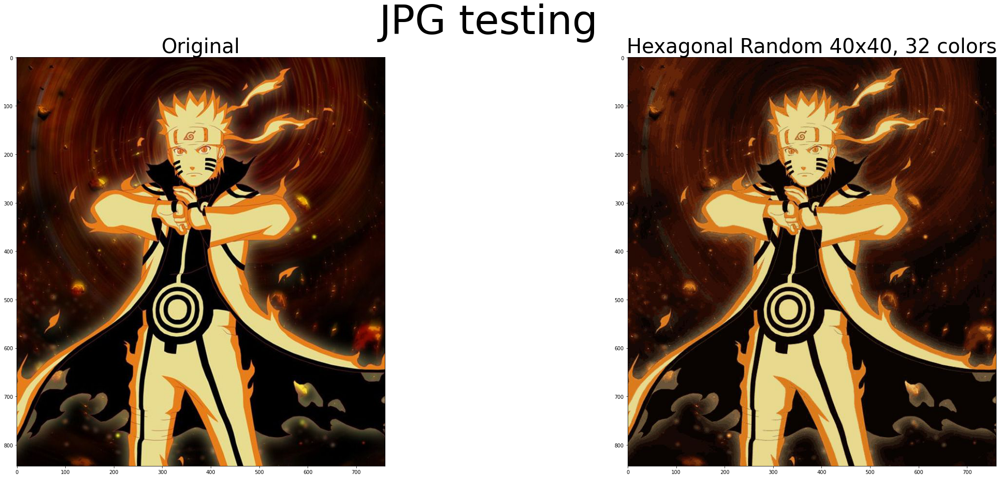

In [30]:
fig=plt.figure(figsize=(40, 15))

ax = plt.subplot(1, 2, 1)
plt.imshow(original_n)
plt.title('Original',fontsize=40)
ax = plt.subplot(1, 2, 2)
plt.imshow(mapaNaruto)
plt.title('Hexagonal Random 40x40, 32 colors',fontsize=40)

fig.suptitle('JPG testing',fontsize=80)

#Final Model

In [6]:
smF = SOMFactory().build(data1, mapsize = [100,100], lattice='rect', mapshape='planar',neighborhood='gaussian', training='batch',
                        initialization='pca', name='messiF', component_names=['R','G','B'])

In [7]:
smF.train(n_job=8, verbose='info', train_rough_len=15, train_finetune_len=5)

 Training...
 pca_linear_initialization took: 0.344000 seconds
 Rough training...
 radius_ini: 13.000000 , radius_final: 3.250000, trainlen: 15

 epoch: 1 ---> elapsed time:  96.409000, quantization error: 0.334811

 epoch: 2 ---> elapsed time:  101.542000, quantization error: 0.210760

 epoch: 3 ---> elapsed time:  98.520000, quantization error: 0.164589

 epoch: 4 ---> elapsed time:  103.216000, quantization error: 0.158578

 epoch: 5 ---> elapsed time:  102.801000, quantization error: 0.150252

 epoch: 6 ---> elapsed time:  101.139000, quantization error: 0.139537

 epoch: 7 ---> elapsed time:  101.198000, quantization error: 0.131273

 epoch: 8 ---> elapsed time:  102.082000, quantization error: 0.124581

 epoch: 9 ---> elapsed time:  103.484000, quantization error: 0.115428

 epoch: 10 ---> elapsed time:  103.407000, quantization error: 0.106054

 epoch: 11 ---> elapsed time:  100.642000, quantization error: 0.097527

 epoch: 12 ---> elapsed time:  103.640000, quantization error: 

In [9]:
colors=128
cl=smF.cluster(colors)
smp = smF.project_data(data1)
cluster=cl[smp]

In [11]:
neurons = smF._normalizer.denormalize_by(smF.data_raw,smF.codebook.matrix)

In [12]:
promedio = np.zeros([colors,3])
for i in range(colors):
    acumulador= []
    [acumulador.append(neurons[j,:]) for j in range(len(cl)) if (i == cl[j])]
    promedio[i,:] = np.mean(acumulador, axis=0)
    

In [14]:
nimg = []

[nimg.append(promedio[cluster[i]]) for i in range(len(smp))]

nimg = np.reshape(nimg,[len(data1),3])
nimg = np.reshape(nimg,np.shape(data))

In [15]:
nimg=(nimg.astype('float64'))*255

Text(0.5, 1.0, 'Rectangular PCA 100x100 128 Colors')

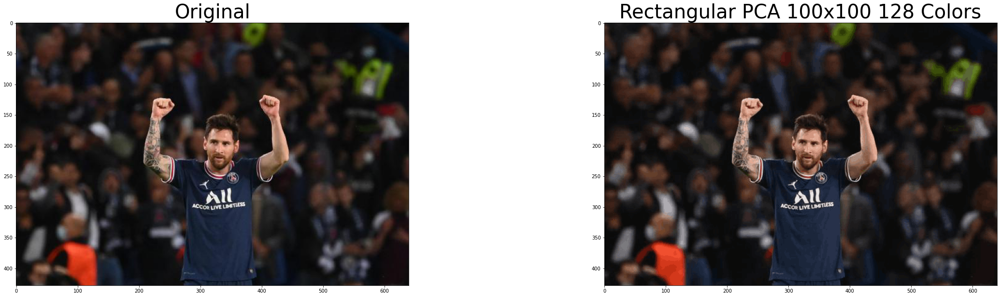

In [23]:
fig=plt.figure(figsize=(40, 10))
img0=(data.reshape(np.shape(data))).astype('uint8')
img=(nimg).astype('uint8')
ax = plt.subplot(1, 2, 1)
plt.imshow(img0)
plt.title('Original',fontsize=40)
ax = plt.subplot(1, 2, 2)
plt.imshow(img)
plt.title('Rectangular PCA 100x100 128 Colors',fontsize=40)

In [19]:
io.imsave('/content/drive/MyDrive/Colab Notebooks/NN/Proyecto_2/messi_compressed.jpg',img)

#Conclusions


*   It can be seen how, as the size of the map increases, less information is lost from the image.
*   The best performing topology was found to be the rectangular type, with a Principal Component Analysis (PCA) initialization. Nevertheless, the hexagon type also had a good performance
*   Due to the image format (jpeg), the final size was not affected as much. For this reason, an external test was performed with an image in jpg format and a decrease in size of approximately 9% was obtained (naruto image at the end of the notebook).

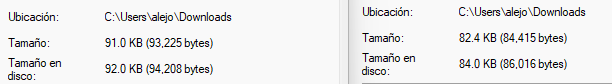



*   During the project, 3 tests were carried out with map sizes of 10x10, 20x20 and 40x40; This left the 40x40 as the winner, as mentioned above, the bigger the mapsize, the better. This is why, for the final model, a training was carried out with a mapize of 100x100.


*   Three cluster sizes were compared, equivalent to taking a number of colors for the image. Thanks to this comparison, it is easy to see that after 128 colors (clusters), the image has an almost imperceptible color loss.



